<a href="https://colab.research.google.com/github/ohjungmin317/SKT_FLY_AI_ML/blob/main/Week2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# week2 day1 2023 07 03

In [ ]:
# 1.간단한 데이터셋 생성
X = [[0., 0.], [1., 1.]]
y = [[0, 1],[1, 1]]

In [ ]:
from sklearn.neural_network import MLPClassifier

In [ ]:
clf = MLPClassifier(solver = "lbfgs", alpha = 1e-5, hidden_layer_sizes = (5,2), random_state = 1)
clf.fit(X,y)

MLPClassifier(alpha=1e-05, hidden_layer_sizes=(5, 2), random_state=1,
              solver='lbfgs')

In [ ]:
clf.predict([[2.,2.],[-1.,-2]])

array([[1, 1],
       [0, 1]])

In [ ]:
clf.coefs_

[array([[-0.15011367, -0.62860541, -0.90433213, -3.45938109, -0.63904618],
        [-0.73749132, -1.5947694 , -0.2793927 , -3.28854097,  0.0702225 ]]),
 array([[ 0.30838904, -0.14960207],
        [ 3.14928608, -0.65056811],
        [-0.54615798,  0.54407041],
        [ 4.36386369, -0.33753023],
        [ 0.34792663,  0.68091737]]),
 array([[-3.58233912,  2.68515229],
        [ 0.9049651 , -0.96123048]])]

In [ ]:
[coef.shape for coef in  clf.coefs_]

[(2, 5), (5, 2), (2, 2)]

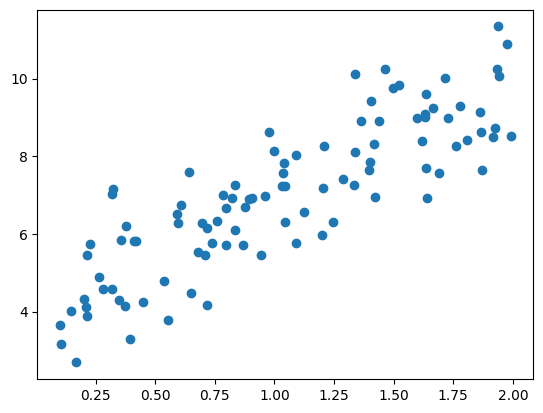

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
x = 2 * np.random.rand(100,1) # [0, 1) 범위에서 균일한 분포 100 X 1 array
y = 4 + 3*x + np.random.randn(100,1) # normal distribution(mu=0,var=1)분포 100 X 1 array
plt.scatter(x,y)
plt.show()

In [ ]:
x_b = np.c_[np.ones((100,1)),x] # 모든 샘플에 index 0번에 1을 추가

# np.linalg.inv는 넘파이 선형대수 모듈(linalg)의 inv(역함수)
# .dot은 행렬 곱셈
theta_best = np.linalg.inv(x_b.T.dot(x_b)).dot(x_b.T).dot(y)
theta_best

array([[3.96244352],
       [2.93824795]])

In [ ]:
x_new = np.array([[0],[2]])
x_new_b = np.c_[np.ones((2,1)),x_new]
prediction = x_new_b.dot(theta_best)
prediction

array([[3.96244352],
       [9.83893941]])

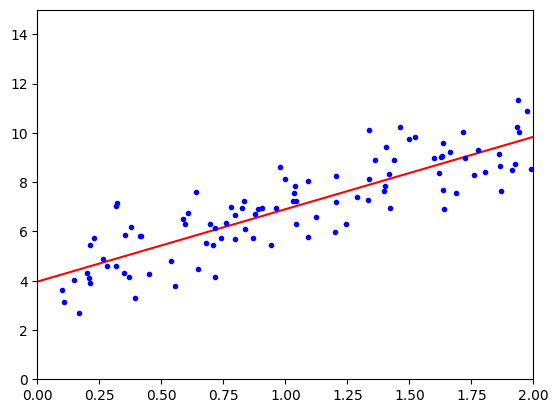

In [ ]:
plt.plot(x_new,prediction,"r-")
plt.plot(x,y,"b.")
plt.axis([0,2,0,15]) # x축 범위 0~2, y축 범위 0~15
plt.show()

In [ ]:
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(x,y)
print(lin_reg.intercept_,lin_reg.coef_)

[3.96244352] [[2.93824795]]


In [ ]:
print(lin_reg.predict(x_new))

[[3.96244352]
 [9.83893941]]


In [ ]:
import numpy as np

x = 2 * np.random.rand(100,1) # 100 x 1 크기의 0~1의 균일분포
x_b = np.c_[np.ones((100,1)),x] # bias(1)를 전체 데이터에 추가
y = 4 + 3*np.random.randn(100,1) # 100 x 1 크기의 표준정규분포 추출

learning_rate = 0.001
iterations = 1000
m = x_b.shape[0] # 100개 (x 데이터)

theta = np.random.randn(2,1) # 2x1 크기의 평균 0, 분산1 정규 분포 추출

for iteration in range(iterations):
  gradients = 2/m * x_b.T.dot(x_b.dot(theta)-y)
  theta = theta - (learning_rate * gradients)


In [ ]:
theta

array([[2.26150548],
       [1.45334905]])

In [ ]:
import numpy as np
data_num = 1000
x = 3 * np.random.rand(data_num,1) - 1
y = 0.2 * (x**2) + np.random.randn(1000,1)

from sklearn.preprocessing import PolynomialFeatures
poly_features = PolynomialFeatures(degree=2,include_bias=False)
x_poly = poly_features.fit_transform(x)
print(x[0])
print(x_poly[0])

[1.17544998]
[1.17544998 1.38168266]


In [ ]:
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(x_poly,y)
print(lin_reg.intercept_,lin_reg.coef_)

[-0.01713888] [[0.06959435 0.19580435]]


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['axes.unicode_minus'] = False ## 마이나스 '-' 표시 제대로 출력

from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression

#df = pd.read_csv('./toluca_company_dataset.csv') ## 데이터 불러오기

In [ ]:
df.head(5)

NameError: ignored

In [ ]:
fig = plt.figure(figsize=(8,8))
fig.set_facecolor('white')

font_size = 15
plt.scatter(df['Lot_size'],df['Work_hours']) ## 원 데이터 산포도

plt.xlabel('Lot Size', fontsize=font_size)
plt.ylabel('Work Hours',fontsize=font_size)
plt.show()

In [ ]:
fit = ols('Work_hours ~ Lot_size',data=df).fit() ## 단순선형회귀모형 적합

In [ ]:
fit.summary()

In [ ]:
fit= ols('Work_hours ~ Lot_size -1',data=df).fit()

In [ ]:
fit.fittedvalues

In [ ]:
# 모델검증에 필요한 잔차

fit.resid

In [ ]:
#예측값
fit.predict(exog = dict(Lot_size =[80]))

In [ ]:
## 시각화
fig = plt.figure(figsize=(8,8))
fig.set_facecolor('white')

font_size = 15
plt.scatter(df['Lot_size'],df['Work_hours']) ## 원 데이터 산포도
plt.plot(df['Lot_size'],fit.fittedvalues,color='red') ## 회귀직선 추가

plt.xlabel('Lot Size', fontsize=font_size)
plt.ylabel('Work Hours',fontsize=font_size)
plt.show()

In [ ]:
## 잔차도 Residual Plot
fig = plt.figure(figsize=(8,8))
fig.set_facecolor('white')

font_size = 15

plt.scatter(df['Lot_size'],fit.resid) ## 잔차도 출력

plt.xlabel('Lot Size', fontsize=font_size)
plt.ylabel('Residual', fontsize=font_size)
plt.show()

In [ ]:
## sklearn linear regression 사용
x = df['Lot_size'].values.reshape(-1,1) ## 차원 증가 시켜준다.
y = df['Work_hours']

fit = LinearRegression().fit(x,y) ## 단순선형회귀모형 적합

In [ ]:
# 회귀 계수
print('절편:',fit.intercept_)
print('기울기:', fit.coef_)

In [ ]:
fit.predict(x)

In [ ]:
residual = y - fit.predict(x)
print(residual)

In [ ]:
fit.predict([[80]])

In [ ]:
import numpy as np

#무작위로 선형 데이터셋 생성
X = 2 * np.random.rand(100,1)  #rand: 난수 생성 함수
y = 4 +  3 * X + np.random.randn(100,1) #randn은 정규분포에 대한 난수 생성

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split


lin_reg = LinearRegression()
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

lin_reg.fit(X_train, y_train)

print(lin_reg.intercept_)  #편향(절편)
print(lin_reg.coef_)       #가중치
print(lin_reg.score(X_train, y_train)) #train set 점수
print(lin_reg.score(X_test, y_test)) #test set 점수

[3.8138976]
[[3.06906894]]
0.8138910663317127
0.7603089068561104


In [ ]:
import pandas as pd

boston = pd.read_csv('./Boston_house.csv')
boston.head()

FileNotFoundError: ignored

In [ ]:
# 범죄율, 주택당 방 수, 인구 중 하위 계층 비율, 노후 주택 비율과 주택가격과의 상관관계를 예측

from sklearn.model_selection import train_test_split

X = boston[['CRIM','RM', 'LSTAT', 'AGE']]
y = boston[['Target']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
#실제 주택값과 예측한 주택값 간의 상관관계

plt.scatter(y_test, y_pred, alpha=0.4)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("LINEAR REGRESSION")
plt.show()

In [ ]:
reg.coef_

In [ ]:
plt.scatter(boston[['CRIM']], boston[['Target']], alpha=0.4)
plt.show()

In [ ]:
plt.scatter(boston[['RM']], boston[['Target']], alpha=0.4)
plt.show()

In [ ]:
plt.scatter(boston[['LSTAT']], boston[['Target']], alpha=0.4)
plt.show()

In [ ]:
plt.scatter(boston[['AGE']], boston[['Target']], alpha=0.4)
plt.show()

In [ ]:
boston.info()

In [ ]:
plt.scatter(boston[['AGE']], boston[['TAX']], alpha=0.4)
plt.show()

In [ ]:
plt.scatter(boston[['CRIM']], boston[['DIS']], alpha=0.4)
plt.show()

In [ ]:
plt.scatter(boston[['RM']], boston[['DIS']], alpha=0.4)
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

X = boston[['CRIM','RM', 'TAX', 'AGE']]
y = boston[['Target']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
import matplotlib.pyplot as plt
%matplotlib inline

NameError: ignored

In [ ]:
reg.score(X_train, y_train) #train set R^2 점수
reg.score(X_test, y_test) #test set R^2 점수

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
df = pd.read_csv("penguins.csv")

In [ ]:
df = df.dropna()

In [ ]:
enc = LabelEncoder()
s = enc.fit_transform(df['sex'])
s
df['sex']= s

In [ ]:
from sklearn.model_selection import train_test_split

X = df[['flipper_length_mm','bill_length_mm', 'body_mass_g', 'sex']]
y = df[['bill_depth_mm']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
print("TRAIN : ",reg.score(X_train, y_train)) #train set R^2 점수
print("TEST : " , reg.score(X_test, y_test)) #test set R^2 점수

In [ ]:
plt.scatter(y_test, y_pred, alpha=0.4)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("LINEAR REGRESSION")
plt.show()

In [ ]:
reg.coef_

In [ ]:
import pandas as pd

In [ ]:
db = pd.read_csv('./diabetes.csv')

In [ ]:
db.info()

In [ ]:
db.head()

In [ ]:
db.isna().sum(axis=0)

In [ ]:
cols = ['Glucose', 'BloodPressure', 'SkinThickness','Insulin', 'BMI']
(db[cols] == 0).sum(axis=0)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(8,6))
sns.countplot(x='Outcome', data = db)
plt.show()

In [ ]:
db['Outcome'].value_counts()

In [ ]:
X_data = db.drop(['Outcome'], axis=1)
X_data.head()

In [ ]:
y_data = db['Outcome'] # 당뇨병 데이터에서 outcome은 y 데이터로 분류 (정답데이)
y_data.head()

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_data,y_data,
 test_size=0.2, random_state=42)
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

In [ ]:
import numpy as np
def impute_zero(data, col):
  df = data.loc[data[col] != 0, col]
  avg = np.sum(df) / len(df)
  k = len(data.loc[ data[col] == 0, col])
  data.loc[ data[col] == 0, col ] = avg
  print('%s : fixed %d, mean: %.3f' % (col, k, avg))
for col in cols:
  impute_zero(X_train, col)

In [ ]:
(X_train[cols] == 0).sum(axis=0)

In [ ]:
for col in cols:
  impute_zero(X_test, col)

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s = scaler.transform(X_test)
print(X_train_s[:5])


In [ ]:
y_train = y_train.values
y_test = y_test.values
print(type(y_train), type(y_test))

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
def build_model():
  model = keras.Sequential()
  model.add(layers.Dense(12, input_dim=8, activation='relu'))
  model.add(layers.Dense(8, activation='relu'))
  model.add(layers.Dense(1, activation='sigmoid'))
  return model

In [ ]:
model = build_model()
model.summary()

In [ ]:
model.compile(loss='binary_crossentropy',
 optimizer='adam',
 metrics=['acc'])


In [ ]:
EPOCHS = 500
BATCH_SIZE = 16
history = model.fit(X_train_s, y_train,
 epochs=EPOCHS,
 batch_size=BATCH_SIZE,
 validation_split = 0.2,
 verbose=1)

In [ ]:
import matplotlib.pyplot as plt
def plot_history(history):
 hist = pd.DataFrame(history.history)
 hist['epoch'] = history.epoch
 plt.figure(figsize=(16,8))
 plt.subplot(1,2,1)
 plt.xlabel('Epoch')
 plt.ylabel('Loss')
 plt.plot(hist['epoch'], hist['loss'], label='Train Loss')
 plt.plot(hist['epoch'], hist['val_loss'], label = 'Val Loss')
 plt.legend()
 plt.subplot(1,2,2)
 plt.xlabel('Epoch')
 plt.ylabel('Accuracy')
 plt.plot(hist['epoch'], hist['acc'], label='Train Accuracy')
 plt.plot(hist['epoch'], hist['val_acc'], label = 'Val Accuracy')
 plt.legend()
 plt.show()


In [ ]:
plot_history(history)


In [ ]:
model.compile(loss='binary_crossentropy', optimizer='adam',metrics=['acc'])

In [ ]:
EPOCHS = 500
BATCH_SIZE = 16
history = model.fit(X_train_s, y_train,
 epochs=EPOCHS,
 batch_size=BATCH_SIZE,
 validation_split = 0.2,
 verbose=1)

In [ ]:
import matplotlib.pyplot as plt
def plot_history(history):
 hist = pd.DataFrame(history.history)
 hist['epoch'] = history.epoch
 plt.figure(figsize=(16,8))
 plt.subplot(1,2,1)
 plt.xlabel('Epoch')
 plt.ylabel('Loss')
 plt.plot(hist['epoch'], hist['loss'], label='Train Loss')
 plt.plot(hist['epoch'], hist['val_loss'], label = 'Val Loss')
 plt.legend()
 plt.subplot(1,2,2)
 plt.xlabel('Epoch')
 plt.ylabel('Accuracy')
 plt.plot(hist['epoch'], hist['acc'], label='Train Accuracy')
 plt.plot(hist['epoch'], hist['val_acc'], label = 'Val Accuracy')
 plt.legend()
 plt.show()

In [ ]:
plot_history(history)

In [ ]:
from tensorflow.keras.datasets import fashion_mnist
import tensorflow as tf

In [ ]:
mnist = tf.keras.datasets.mnist
(X_train, y_train), (X_test, y_test) = fashion_mnist.load_data()

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

In [ ]:
class_names =['T-shirp/top','Trouser','Pullover','Dress','Coat','Sandal','Shirt','Sneaker','Bag','Ankle boot']

samples = np.random.randint(len(X_train), size = 9)

plt.figure(figsize = (8,6))
for i , idx in enumerate(samples):
  plt.subplot(3,3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X_train[idx], cmap ='gray')
  plt.title(class_names[y_train[idx]])
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size = 0.3, random_state = 42)

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

In [ ]:
import numpy as np

X_train = X_train.astype('float32')/255
X_val = X_val.astype('float32')/255
X_test = X_test.astype('float32')/255

print(np.max(X_train), np.min(X_train))

In [ ]:
X_train = (X_train.reshape((-1,28*28)))
X_val = (X_val.reshape((-1,28*28)))
X_test = (X_test.reshape((-1,28*28)))

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

In [ ]:
from tensorflow.keras.utils import to_categorical
y_train_oh = to_categorical(y_train)
y_val_oh = to_categorical(y_val)
y_test_oh = to_categorical(y_test)

y_train_oh[:5]

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

def build_model():
  model = keras.Sequential()
  model.add(layers.Flatten(input_shape=(784,)))
  model.add(layers.Dense(64, activation ='relu',input_shape = (784,)))
  model.add(layers.Dense(32, input_shape = (784,)))
  model.add(layers.Dense(10, activation ='softmax'))
  return model

In [ ]:
model = build_model()
model.summary()

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate = 0.001)

model.compile(optimizer = 'adam',
              loss = 'categorical_crossentropy',
              metrics = ['acc'])

In [ ]:
EPOCHS = 500
BATCH_SIZE =64

history = model.fit(X_train, y_train_oh,
                    epochs = EPOCHS,
                    batch_size = BATCH_SIZE,
                    validation_split = .2)

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  plt.figure(figsize = (16,8))

  plt.subplot(1,2,1)
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.plot(hist['epoch'], hist['loss'], label='Train Loss')
  plt.plot(hist['epoch'], hist['val_loss'], label='Val Loss')
  plt.legend()

  plt.subplot(1,2,2)
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.plot(hist['epoch'], hist['acc'], label='Train Accuracy')
  plt.plot(hist['epoch'], hist['val_acc'], label='Val Accuracy')
  plt.legend()

plt.show()

In [ ]:
plot_history(history)

In [ ]:
y_pred = model.predict(X_test)
y_pred[:1]

In [ ]:
y_pred_argmax = np.argmax(y_pred, axis = 1)
y_pred_argmax[:10]

In [ ]:
n_rows = 3
n_cols = 8

In [ ]:
n_rows = 3
n_cols = 8

plt.figure(figsize = (n_cols *2, n_rows *2))
plt.figure(figsize = (n_cols *2, n_rows *2))
for row in range(n_rows):
  for col in range(n_cols):
    index = n_cols * row + col
    plt.subplot(n_rows, n_cols, index + 1)
    plt.imshow(X_test[index].reshape(28,28), cmap = 'gray')
    #plt.imshow(X_test[index], cmap = 'gray')
    plt.axis('off')
    plt.title(f'{class_names[y_pred_argmax[index]]}({class_names[y_test[index]]})')

  plt.show()

In [ ]:
mnist = tf.keras.datasets.mnist

In [ ]:
from tensorflow.keras.datasets import fashion_mnist
import tensorflow as tf

In [ ]:
mnist = tf.keras.datasets.mnist

In [ ]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

11490434/11490434 [==============================] - 0s 0us/step
(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


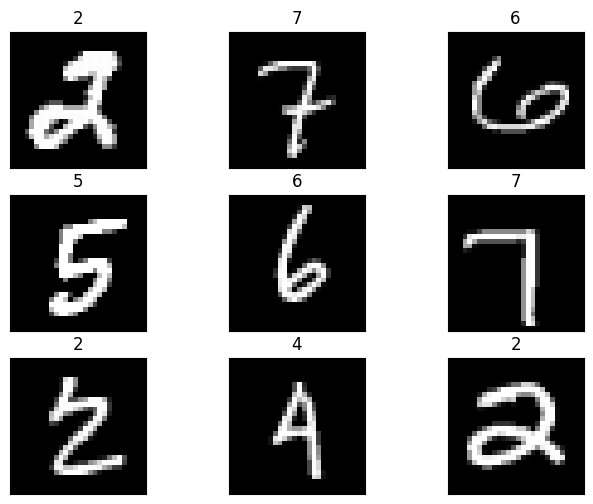

In [ ]:
class_names =['0','1','2','3','4','5','6','7','8','9']

samples = np.random.randint(len(X_train), size = 9)

plt.figure(figsize = (8,6))
for i , idx in enumerate(samples):
  plt.subplot(3,3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X_train[idx], cmap ='gray')
  plt.title(class_names[y_train[idx]])
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size = 0.3, random_state = 42)

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(42000, 28, 28) (42000,)
(18000, 28, 28) (18000,)


In [ ]:
import numpy as np

X_train = X_train.astype('float32')/255
X_val = X_val.astype('float32')/255
X_test = X_test.astype('float32')/255

print(np.max(X_train), np.min(X_train))


1.0 0.0


In [ ]:
X_train = (X_train.reshape((-1,28*28)))
X_val = (X_val.reshape((-1,28*28)))
X_test = (X_test.reshape((-1,28*28)))

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

(42000, 784) (42000,)
(18000, 784) (18000,)
(10000, 784) (10000,)


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

def build_model():
  model = keras.Sequential()
  model.add(layers.Flatten(input_shape=(784,)))
  model.add(layers.Dense(64, activation ='relu',input_shape = (784,)))
  model.add(layers.Dense(32, input_shape = (784,)))
  model.add(layers.Dense(10, activation ='softmax'))
  return model

In [ ]:
model = build_model()
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 784)               0         
                                                                 
 dense_8 (Dense)             (None, 64)                50240     
                                                                 
 dense_9 (Dense)             (None, 32)                2080      
                                                                 
 dense_10 (Dense)            (None, 10)                330       
                                                                 
Total params: 52,650
Trainable params: 52,650
Non-trainable params: 0
_________________________________________________________________


In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate = 0.001)

model.compile(optimizer = 'adam',
              loss = 'categorical_crossentropy',
              metrics = ['acc'])

In [ ]:
EPOCHS = 100
BATCH_SIZE =64

history = model.fit(X_train, y_train_oh,
                    epochs = EPOCHS,
                    batch_size = BATCH_SIZE,
                    validation_split = .2)

Epoch 1/100
525/525 [==============================] - 6s 7ms/step - loss: 0.4124 - acc: 0.8830 - val_loss: 0.2284 - val_acc: 0.9368
Epoch 2/100
525/525 [==============================] - 3s 5ms/step - loss: 0.1868 - acc: 0.9453 - val_loss: 0.1775 - val_acc: 0.9487
Epoch 3/100
525/525 [==============================] - 3s 5ms/step - loss: 0.1363 - acc: 0.9604 - val_loss: 0.1583 - val_acc: 0.9523
Epoch 4/100
525/525 [==============================] - 2s 4ms/step - loss: 0.1075 - acc: 0.9685 - val_loss: 0.1376 - val_acc: 0.9600
Epoch 5/100
525/525 [==============================] - 2s 3ms/step - loss: 0.0874 - acc: 0.9739 - val_loss: 0.1246 - val_acc: 0.9629
Epoch 6/100
525/525 [==============================] - 2s 3ms/step - loss: 0.0703 - acc: 0.9786 - val_loss: 0.1391 - val_acc: 0.9593
Epoch 7/100
525/525 [==============================] - 2s 4ms/step - loss: 0.0597 - acc: 0.9804 - val_loss: 0.1209 - val_acc: 0.9645
Epoch 8/100
525/525 [==============================] - 2s 4ms/step - 

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  plt.figure(figsize = (16,8))

  plt.subplot(1,2,1)
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.plot(hist['epoch'], hist['loss'], label='Train Loss')
  plt.plot(hist['epoch'], hist['val_loss'], label='Val Loss')
  plt.legend()

  plt.subplot(1,2,2)
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.plot(hist['epoch'], hist['acc'], label='Train Accuracy')
  plt.plot(hist['epoch'], hist['val_acc'], label='Val Accuracy')
  plt.legend()

plt.show()

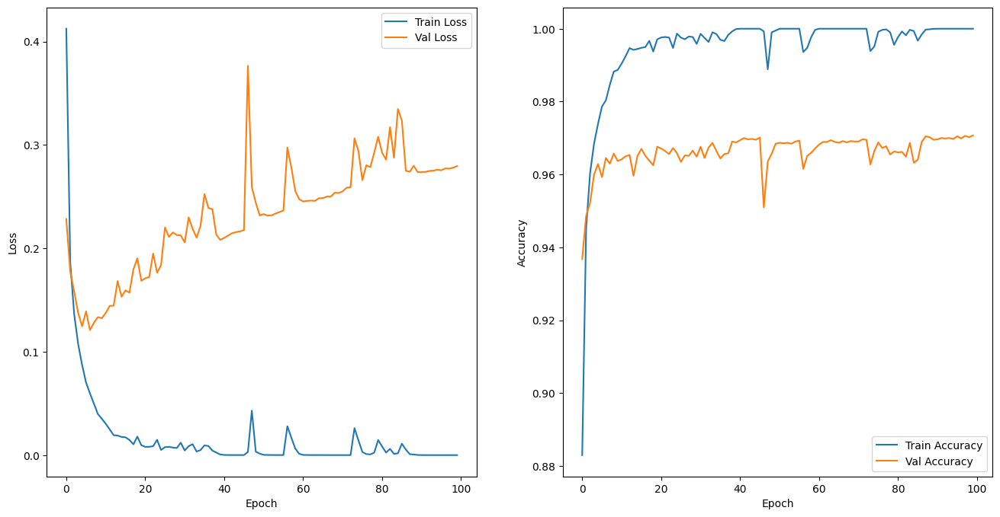

In [ ]:
plot_history(history)

In [ ]:
y_pred = model.predict(X_test)
y_pred[:1]

313/313 [==============================] - 1s 2ms/step


array([[8.04184939e-16, 3.07023836e-27, 1.00347917e-19, 9.45473283e-11,
        3.89444212e-30, 1.56466269e-22, 2.42951964e-26, 1.00000000e+00,
        3.80815446e-19, 5.14313592e-11]], dtype=float32)

In [ ]:
y_pred_argmax = np.argmax(y_pred, axis = 1)
y_pred_argmax[:10]

array([7, 2, 1, 0, 4, 1, 4, 9, 5, 9])

<Figure size 1600x600 with 0 Axes>

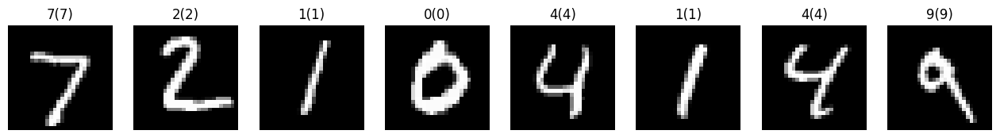

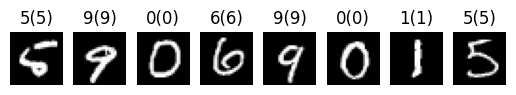

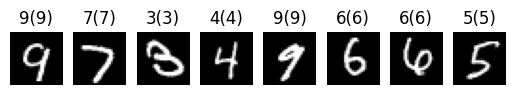

In [ ]:
n_rows = 3
n_cols = 8

plt.figure(figsize = (n_cols *2, n_rows *2))
plt.figure(figsize = (n_cols *2, n_rows *2))
for row in range(n_rows):
  for col in range(n_cols):
    index = n_cols * row + col
    plt.subplot(n_rows, n_cols, index + 1)
    plt.imshow(X_test[index].reshape(28,28), cmap = 'gray')
    #plt.imshow(X_test[index], cmap = 'gray')
    plt.axis('off')
    plt.title(f'{class_names[y_pred_argmax[index]]}({class_names[y_test[index]]})')

  plt.show()

## week2 day2 2023 07 04

In [ ]:
import numpy as np
from tensorflow.keras.datasets import fashion_mnist

(X_train, y_train), (X_test, y_test) = fashion_mnist.load_data()
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

4422102/4422102 [==============================] - 0s 0us/step
(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


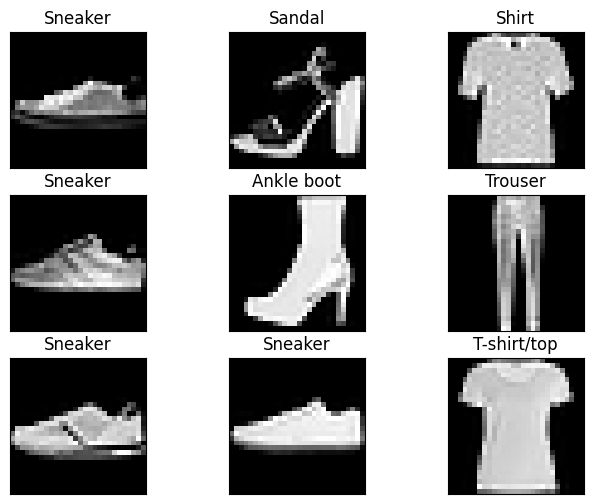

In [ ]:
import matplotlib.pyplot as plt


class_names = ['T-shirt/top', 'Trouser', 'Pullover',
               'Dress', 'Coat', 'Sandal',
               'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
samples = np.random.randint(len(X_train), size=9)
plt.figure(figsize = (8, 6))
for i, idx in enumerate(samples):
   plt.subplot(3, 3, i+1)
   plt.xticks([])
   plt.yticks([])
   plt.imshow(X_train[idx], cmap = 'gray')
   plt.title(class_names[y_train[idx]])
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(
            X_train, y_train, test_size = 0.3, random_state = 42)
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(42000, 28, 28) (42000,)
(18000, 28, 28) (18000,)


In [ ]:
import numpy as np
X_train = X_train.astype('float32') / 255.
X_val = X_val.astype('float32') / 255.
X_test = X_test.astype('float32') / 255.
print(np.max(X_train), np.min(X_train))

1.0 0.0


In [ ]:
print('X_train : ', X_train.shape)
print('X_val : ', X_val.shape)
print('X_test : ', X_test.shape)

X_train :  (42000, 28, 28)
X_val :  (18000, 28, 28)
X_test :  (10000, 28, 28)


In [ ]:
import tensorflow as tf

X_train = X_train[..., tf.newaxis]
X_val = X_val[..., tf.newaxis]
X_test = X_test[..., tf.newaxis]

print('X_train : ', X_train.shape)
print('X_val : ', X_val.shape)
print('X_test : ', X_test.shape)


X_train :  (42000, 28, 28, 1)
X_val :  (18000, 28, 28, 1)
X_test :  (10000, 28, 28, 1)


In [ ]:
from tensorflow.keras.utils import to_categorical
y_train_oh = to_categorical(y_train)
y_val_oh = to_categorical(y_val)
y_test_oh = to_categorical(y_test)
y_train_oh[:5]

array([[0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]], dtype=float32)

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

def build_model():
  model = keras.Sequential()
  model.add(layers.Conv2D(filters = 16, kernel_size = 3,
                          strides = (1,1), padding = 'same',
                          activation ='relu',
                          input_shape = (28, 28,1)))
  model.add(layers.MaxPool2D(pool_size = (2,2), strides = 2))

  model.add(layers.Conv2D(filters = 32, kernel_size = 3,
                          strides = (1,1), padding = 'same',
                          activation ='relu',
                          input_shape = (28, 28,1)))
  model.add(layers.MaxPool2D(pool_size = (2,2), strides = 2))

  model.add(layers.Conv2D(filters = 64, kernel_size = 3,
                          strides = (1,1), padding = 'same',
                          activation ='relu',
                          input_shape = (28, 28,1)))
  model.add(layers.MaxPool2D(pool_size = (2,2), strides = 2))

  model.add(layers.Flatten())
  model.add(layers.Dense(64, activation='relu'))
  model.add(layers.Dense(10, activation='softmax'))
  return model

model = build_model()
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 14, 14, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 14, 14, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 7, 7, 64)          18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 3, 3, 64)        

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=adam,
        loss = 'categorical_crossentropy',
        metrics=['acc'])

In [ ]:
EPOCHS = 3
BATCH_SIZE = 64
history = model.fit(X_train, y_train_oh,
           epochs = EPOCHS,
           batch_size = BATCH_SIZE,
           validation_data = (X_val, y_val_oh),
           verbose = 1)

Epoch 1/3
657/657 [==============================] - 23s 24ms/step - loss: 0.5969 - acc: 0.7841 - val_loss: 0.4079 - val_acc: 0.8510
Epoch 2/3
657/657 [==============================] - 6s 8ms/step - loss: 0.3689 - acc: 0.8676 - val_loss: 0.3331 - val_acc: 0.8792
Epoch 3/3
657/657 [==============================] - 4s 7ms/step - loss: 0.3218 - acc: 0.8837 - val_loss: 0.3112 - val_acc: 0.8874


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch
  plt.figure(figsize=(16,8))
  plt.subplot(1,2,1)
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.plot(hist['epoch'], hist['loss'], label='Train Loss')
  plt.plot(hist['epoch'], hist['val_loss'],label = 'Val Loss')
  plt.legend()

  plt.subplot(1,2,2)
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.plot(hist['epoch'], hist['acc'], label='Train Accuracy')
  plt.plot(hist['epoch'], hist['val_acc'], label = 'Val Accuracy')
  plt.legend()
plt.show()

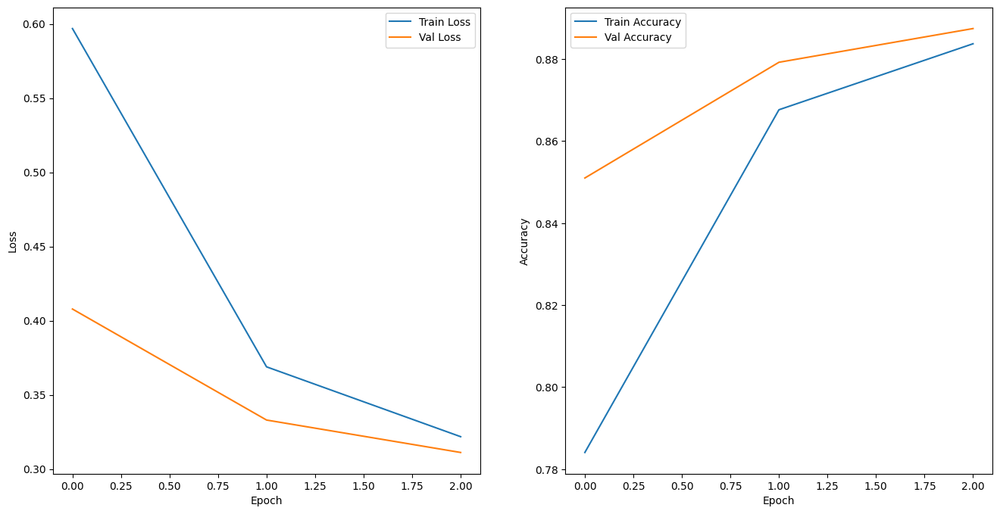

In [ ]:
plot_history(history)

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
def build_dropout_model():
   model = keras.Sequential()
   model.add(layers.Conv2D(filters=16,
                           kernel_size= 3,
                           strides=(1, 1),
                           padding='same',
                           activation='relu',
                           input_shape=(28, 28, 1)))
   model.add(layers.MaxPool2D(pool_size=(2, 2), strides=2))
   model.add(layers.Dropout(0.2))

   model.add(layers.Conv2D(filters=32,
                           kernel_size= 3,
                           strides=(1, 1),
                           padding='same',
                           activation='relu'))
   model.add(layers.MaxPool2D(pool_size=(2, 2), strides=2))
   model.add(layers.Dropout(0.2))

   model.add(layers.Conv2D(filters=64,
                           kernel_size= 3,
                           strides=(1, 1),
                           padding='same',
                           activation='relu'))
   model.add(layers.MaxPool2D(pool_size=(2, 2), strides=2))
   model.add(layers.Dropout(0.2))

   model.add(layers.Flatten())
   model.add(layers.Dense(64, activation = 'relu'))
   model.add(layers.Dense(10, activation = 'softmax'))
   return model

In [ ]:
model = build_dropout_model()
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 14, 14, 16)       0         
 2D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 14, 14, 16)        0         
                                                                 
 conv2d_7 (Conv2D)           (None, 14, 14, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 7, 7, 32)         

In [ ]:
model.compile(optimizer='adam',
              loss = 'categorical_crossentropy',
              metrics=['acc'])

In [ ]:
EPOCHS = 30
BATCH_SIZE = 64
history = model.fit(X_train, y_train_oh,
                    epochs = EPOCHS,
                    batch_size = BATCH_SIZE,
                    validation_data = (X_val, y_val_oh),
                    verbose = 1)

Epoch 1/30
657/657 [==============================] - 8s 8ms/step - loss: 0.7157 - acc: 0.7351 - val_loss: 0.4599 - val_acc: 0.8321
Epoch 2/30
657/657 [==============================] - 5s 7ms/step - loss: 0.4495 - acc: 0.8360 - val_loss: 0.3747 - val_acc: 0.8618
Epoch 3/30
657/657 [==============================] - 4s 6ms/step - loss: 0.3915 - acc: 0.8552 - val_loss: 0.3279 - val_acc: 0.8803
Epoch 4/30
657/657 [==============================] - 5s 7ms/step - loss: 0.3586 - acc: 0.8680 - val_loss: 0.3001 - val_acc: 0.8902
Epoch 5/30
657/657 [==============================] - 5s 7ms/step - loss: 0.3353 - acc: 0.8770 - val_loss: 0.2883 - val_acc: 0.8944
Epoch 6/30
657/657 [==============================] - 6s 10ms/step - loss: 0.3184 - acc: 0.8827 - val_loss: 0.2874 - val_acc: 0.8969
Epoch 7/30
657/657 [==============================] - 8s 12ms/step - loss: 0.3050 - acc: 0.8869 - val_loss: 0.2692 - val_acc: 0.9016
Epoch 8/30
657/657 [==============================] - 5s 7ms/step - loss: 

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch
  plt.figure(figsize=(16,8))
  plt.subplot(1,2,1)
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.plot(hist['epoch'], hist['loss'], label='Train Loss')
  plt.plot(hist['epoch'], hist['val_loss'],label = 'Val Loss')
  plt.legend()

  plt.subplot(1,2,2)
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.plot(hist['epoch'], hist['acc'], label='Train Accuracy')
  plt.plot(hist['epoch'], hist['val_acc'], label = 'Val Accuracy')
  plt.legend()
plt.show()

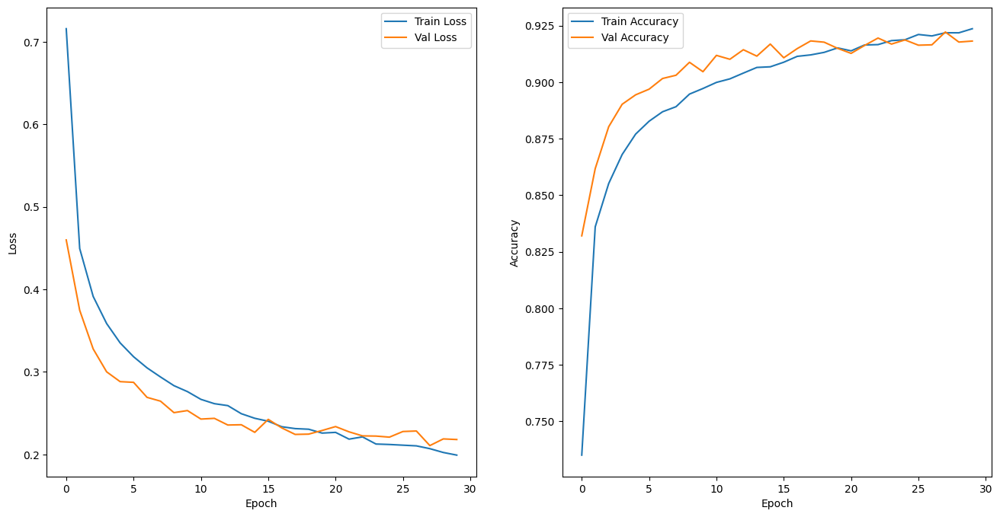

In [ ]:
plot_history(history)

In [ ]:
y_pred = model.predict(X_test)
y_pred_argmax = np.argmax(y_pred, axis=1)
y_pred_argmax[:10]

313/313 [==============================] - 1s 2ms/step


array([9, 2, 1, 1, 6, 1, 4, 6, 5, 7])

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
def print_score(y_test, y_pred):
   print('accuracy: %.3f' % (accuracy_score(y_test, y_pred)))
   print('precision: %.3f' % (precision_score(y_test, y_pred, average='macro')))
   print('recall_score: %.3f' % (recall_score(y_test, y_pred, average='macro')))
   print('f1_score: %.3f' % (f1_score(y_test, y_pred, average='macro')))

In [ ]:
print_score(y_test, y_pred_argmax)

accuracy: 0.915
precision: 0.915
recall_score: 0.915
f1_score: 0.915


In [ ]:
# mnist 사용 및 결과값 비교

In [ ]:
import numpy as np
from tensorflow.keras.datasets import mnist

(X_train, y_train), (X_test, y_test) = mnist.load_data()
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


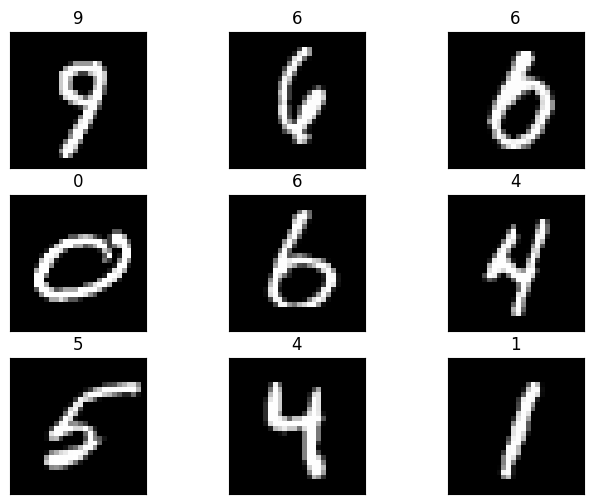

In [ ]:
import matplotlib.pyplot as plt


class_names = ['0', '1', '2',
               '3', '4', '5',
               '6', '7', '8', '9']
samples = np.random.randint(len(X_train), size=9)
plt.figure(figsize = (8, 6))
for i, idx in enumerate(samples):
   plt.subplot(3, 3, i+1)
   plt.xticks([])
   plt.yticks([])
   plt.imshow(X_train[idx], cmap = 'gray')
   plt.title(class_names[y_train[idx]])
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(
            X_train, y_train, test_size = 0.3, random_state = 42)
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(42000, 28, 28) (42000,)
(18000, 28, 28) (18000,)


In [ ]:
import numpy as np
X_train = X_train.astype('float32') / 255.
X_val = X_val.astype('float32') / 255.
X_test = X_test.astype('float32') / 255.
print(np.max(X_train), np.min(X_train))

1.0 0.0


In [ ]:
print('X_train : ', X_train.shape)
print('X_val : ', X_val.shape)
print('X_test : ', X_test.shape)

X_train :  (42000, 28, 28)
X_val :  (18000, 28, 28)
X_test :  (10000, 28, 28)


In [ ]:
import tensorflow as tf

X_train = X_train[..., tf.newaxis]
X_val = X_val[..., tf.newaxis]
X_test = X_test[..., tf.newaxis]

print('X_train : ', X_train.shape)
print('X_val : ', X_val.shape)
print('X_test : ', X_test.shape)

X_train :  (42000, 28, 28, 1)
X_val :  (18000, 28, 28, 1)
X_test :  (10000, 28, 28, 1)


In [ ]:
from tensorflow.keras.utils import to_categorical
y_train_oh = to_categorical(y_train)
y_val_oh = to_categorical(y_val)
y_test_oh = to_categorical(y_test)
y_train_oh[:5]

array([[0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
def build_dropout_model():
   model = keras.Sequential()
   model.add(layers.Conv2D(filters=16,
                           kernel_size= 3,
                           strides=(1, 1),
                           padding='same',
                           activation='relu',
                           input_shape=(28, 28, 1)))
   model.add(layers.MaxPool2D(pool_size=(2, 2), strides=2))
   model.add(layers.Dropout(0.2))

   model.add(layers.Conv2D(filters=32,
                           kernel_size= 3,
                           strides=(1, 1),
                           padding='same',
                           activation='relu'))
   model.add(layers.MaxPool2D(pool_size=(2, 2), strides=2))
   model.add(layers.Dropout(0.2))

   model.add(layers.Conv2D(filters=64,
                           kernel_size= 3,
                           strides=(1, 1),
                           padding='same',
                           activation='relu'))
   model.add(layers.MaxPool2D(pool_size=(2, 2), strides=2))
   model.add(layers.Dropout(0.2))

   model.add(layers.Flatten())
   model.add(layers.Dense(64, activation = 'relu'))
   model.add(layers.Dense(10, activation = 'softmax'))
   return model

In [ ]:
model = build_model()
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 14, 14, 16)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 14, 14, 32)        4640      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 7, 7, 32)         0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 7, 7, 64)          18496     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 3, 3, 64)        

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=adam,
        loss = 'categorical_crossentropy',
        metrics=['acc'])

In [ ]:
EPOCHS = 30
BATCH_SIZE = 64
history = model.fit(X_train, y_train_oh,
                    epochs = EPOCHS,
                    batch_size = BATCH_SIZE,
                    validation_data = (X_val, y_val_oh),
                    verbose = 1)

Epoch 1/30
657/657 [==============================] - 7s 7ms/step - loss: 0.2903 - acc: 0.9135 - val_loss: 0.0924 - val_acc: 0.9714
Epoch 2/30
657/657 [==============================] - 4s 7ms/step - loss: 0.0736 - acc: 0.9770 - val_loss: 0.0639 - val_acc: 0.9800
Epoch 3/30
657/657 [==============================] - 5s 7ms/step - loss: 0.0501 - acc: 0.9844 - val_loss: 0.0527 - val_acc: 0.9838
Epoch 4/30
657/657 [==============================] - 4s 7ms/step - loss: 0.0390 - acc: 0.9881 - val_loss: 0.0478 - val_acc: 0.9855
Epoch 5/30
657/657 [==============================] - 4s 7ms/step - loss: 0.0317 - acc: 0.9901 - val_loss: 0.0438 - val_acc: 0.9863
Epoch 6/30
657/657 [==============================] - 6s 9ms/step - loss: 0.0249 - acc: 0.9923 - val_loss: 0.0389 - val_acc: 0.9886
Epoch 7/30
657/657 [==============================] - 6s 10ms/step - loss: 0.0225 - acc: 0.9928 - val_loss: 0.0424 - val_acc: 0.9866
Epoch 8/30
657/657 [==============================] - 6s 10ms/step - loss: 

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch
  plt.figure(figsize=(16,8))
  plt.subplot(1,2,1)
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.plot(hist['epoch'], hist['loss'], label='Train Loss')
  plt.plot(hist['epoch'], hist['val_loss'],label = 'Val Loss')
  plt.legend()

  plt.subplot(1,2,2)
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.plot(hist['epoch'], hist['acc'], label='Train Accuracy')
  plt.plot(hist['epoch'], hist['val_acc'], label = 'Val Accuracy')
  plt.legend()
plt.show()

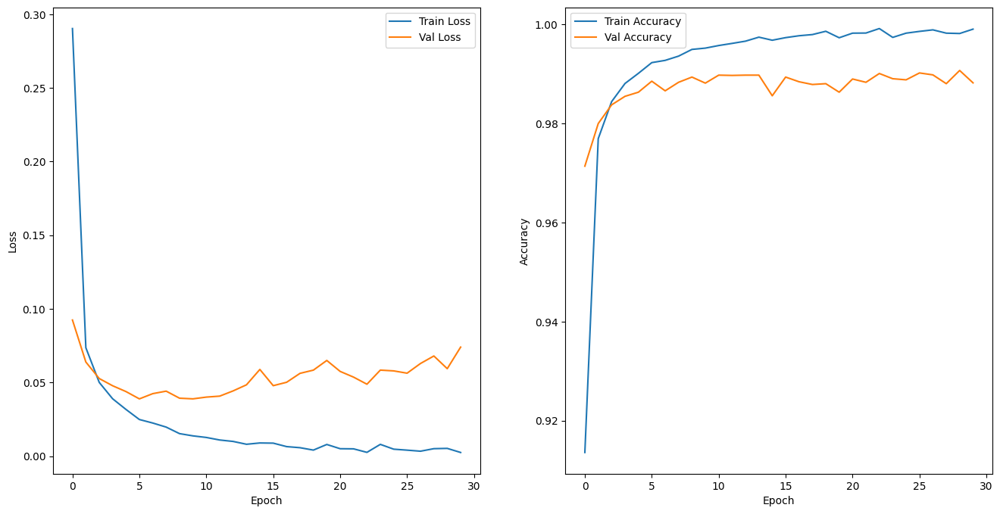

In [ ]:
plot_history(history)

In [ ]:
y_pred = model.predict(X_test)
y_pred_argmax = np.argmax(y_pred, axis=1)
y_pred_argmax[:10]

313/313 [==============================] - 1s 2ms/step


array([7, 2, 1, 0, 4, 1, 4, 9, 5, 9])

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
def print_score(y_test, y_pred):
   print('accuracy: %.3f' % (accuracy_score(y_test, y_pred)))
   print('precision: %.3f' % (precision_score(y_test, y_pred, average='macro')))
   print('recall_score: %.3f' % (recall_score(y_test, y_pred, average='macro')))
   print('f1_score: %.3f' % (f1_score(y_test, y_pred, average='macro')))

In [ ]:
print_score(y_test, y_pred_argmax)

accuracy: 0.989
precision: 0.989
recall_score: 0.989
f1_score: 0.989


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras.datasets import cifar10

(X_train, y_train), (X_test, y_test) = cifar10.load_data()
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(50000, 32, 32, 3) (50000, 1)
(10000, 32, 32, 3) (10000, 1)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras.datasets import cifar10

(X_train, y_train), (X_test, y_test) = cifar10.load_data()
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)


(50000, 32, 32, 3) (50000, 1)
(10000, 32, 32, 3) (10000, 1)


In [ ]:
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(
           X_train, y_train, test_size = 0.3,  random_state = 42)

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)


(35000, 32, 32, 3) (35000, 1)
(15000, 32, 32, 3) (15000, 1)
(10000, 32, 32, 3) (10000, 1)


In [ ]:
y_train = y_train.reshape(-1)
y_val = y_val.reshape(-1)
y_test = y_test.reshape(-1)
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

(35000,)
(15000,)
(10000,)


In [ ]:
import tensorflow as tf
y_train_oh = tf.one_hot(y_train, depth=10)
y_val_oh = tf.one_hot(y_val, depth=10)
y_test_oh = tf.one_hot(y_test, depth=10)
print(y_train_oh.shape)
y_train_oh[:5]

(35000, 10)


<tf.Tensor: shape=(5, 10), dtype=float32, numpy=
array([[0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]], dtype=float32)>

In [ ]:
y_train_oh = y_train_oh.numpy()
y_val_oh = y_val_oh.numpy()
y_test_oh = y_test_oh.numpy()
print(y_train_oh.shape)
print(y_val_oh.shape)
print(y_test_oh.shape)

(35000, 10)
(15000, 10)
(10000, 10)


In [ ]:
from keras import layers

def build_model():
   model = keras.Sequential()

   model.add(layers.Conv2D(32, 3, padding = 'same',
         activation='relu', input_shape = (32, 32, 3)))
   model.add(layers.MaxPooling2D(2))
   model.add(layers.Dropout(0.3))

   model.add(layers.Conv2D(64, 3, padding = 'same',
         activation='relu'))
   model.add(layers.MaxPooling2D(2))
   model.add(layers.Dropout(0.3))

   model.add(layers.Conv2D(256, 3, padding = 'same',
         activation='relu'))
   model.add(layers.MaxPooling2D(2))
   model.add(layers.Dropout(0.3))

   model.add(layers.Conv2D(256, 3, padding = 'same',
         activation='relu'))
   model.add(layers.MaxPooling2D(2))
   model.add(layers.Dropout(0.3))

   model.add(layers.Flatten())
   model.add(layers.Dense(256, activation='relu'))
   model.add(layers.Dense(10, activation='softmax'))
   return model

In [ ]:
model = build_model()
model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 dropout_6 (Dropout)         (None, 16, 16, 32)        0         
                                                                 
 conv2d_19 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 8, 8, 64)         0         
 g2D)                                                            
                                                                 
 dropout_7 (Dropout)         (None, 8, 8, 64)         

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=adam,
         loss = 'categorical_crossentropy',
         metrics=['acc'])
EPOCHS = 100
BATCH_SIZE = 256
history = model.fit(X_train, y_train_oh,
           epochs = EPOCHS,
           batch_size = BATCH_SIZE,
           validation_data = (X_val, y_val_oh))

Epoch 1/100
137/137 [==============================] - 11s 29ms/step - loss: 2.1721 - acc: 0.1803 - val_loss: 2.0526 - val_acc: 0.2398
Epoch 2/100
137/137 [==============================] - 3s 22ms/step - loss: 1.9125 - acc: 0.2989 - val_loss: 1.9194 - val_acc: 0.3065
Epoch 3/100
137/137 [==============================] - 3s 21ms/step - loss: 1.7734 - acc: 0.3551 - val_loss: 1.8126 - val_acc: 0.3471
Epoch 4/100
137/137 [==============================] - 3s 22ms/step - loss: 1.6890 - acc: 0.3836 - val_loss: 1.7150 - val_acc: 0.3827
Epoch 5/100
137/137 [==============================] - 3s 22ms/step - loss: 1.6257 - acc: 0.4035 - val_loss: 1.6773 - val_acc: 0.3899
Epoch 6/100
137/137 [==============================] - 3s 20ms/step - loss: 1.5775 - acc: 0.4197 - val_loss: 1.5562 - val_acc: 0.4419
Epoch 7/100
137/137 [==============================] - 3s 22ms/step - loss: 1.5406 - acc: 0.4343 - val_loss: 1.5177 - val_acc: 0.4635
Epoch 8/100
137/137 [==============================] - 4s 33m

In [ ]:
model = build_model()
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 dropout_10 (Dropout)        (None, 16, 16, 32)        0         
                                                                 
 conv2d_23 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 8, 8, 64)         0         
 g2D)                                                            
                                                                 
 dropout_11 (Dropout)        (None, 8, 8, 64)        

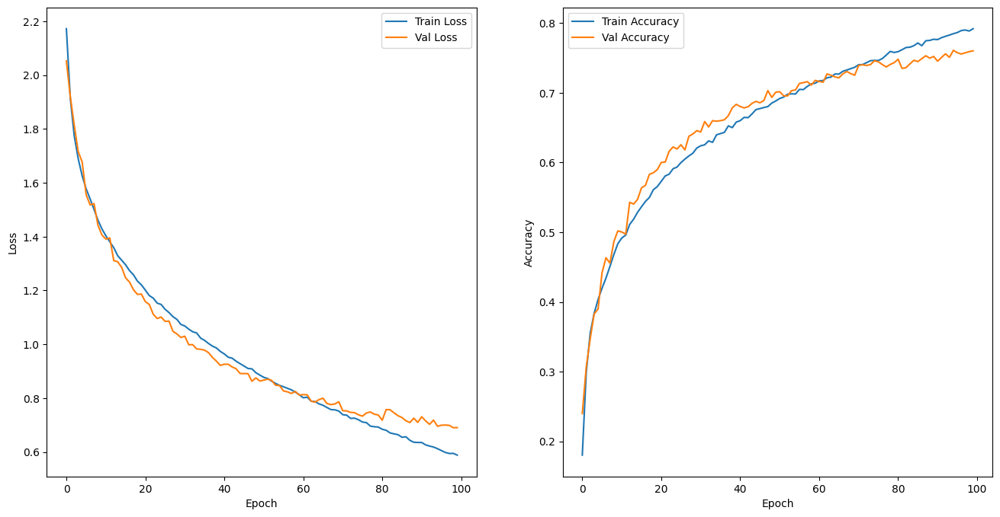

In [ ]:
plot_history(history)

In [ ]:
y_pred = model.predict(X_test)
y_pred_argmax = np.argmax(y_pred, axis=1)

313/313 [==============================] - 2s 5ms/step


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def plot_matrix(y_test, y_pred):
   plt.figure(figsize = (10, 8))
   cm = confusion_matrix(y_test, y_pred)
   sns.heatmap(cm, annot = True, fmt = 'd',cmap = 'Blues')
   plt.xlabel('predicted label', fontsize = 15)
   plt.ylabel('true label', fontsize = 15)
   plt.show()

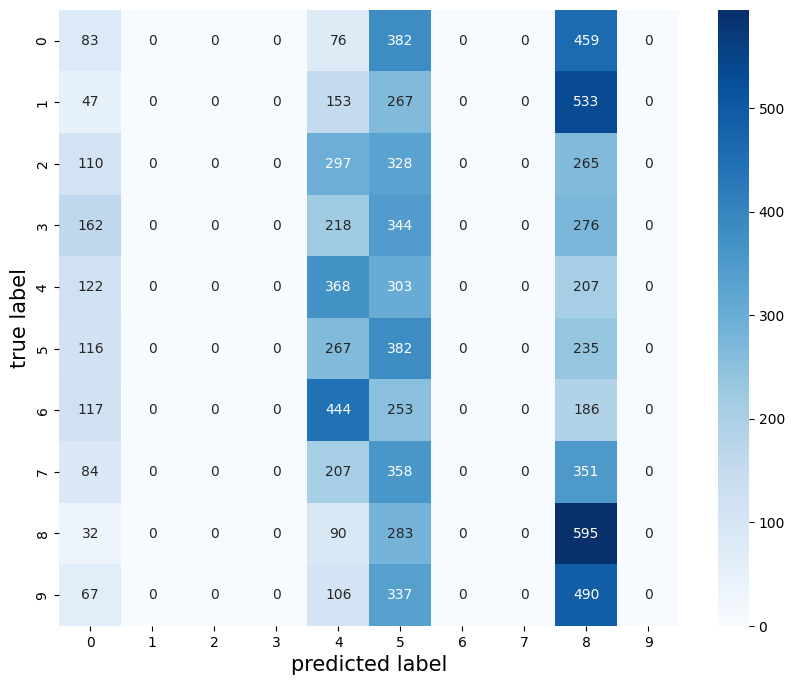

In [ ]:
plot_matrix(y_test, y_pred_argmax)

In [ ]:
model = build_model()
adam = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=adam,
         loss = 'categorical_crossentropy',
         metrics=['acc'])

In [ ]:
from keras import callbacks

checkpoint_path = 'temp/cifar_10.ckpt'
checkpoint = callbacks.ModelCheckpoint(checkpoint_path,
                                       save_weights_only=True,
                                       save_best_only=True,
                                       monitor='val_loss')

In [ ]:
EPOCHS = 100
BATCH_SIZE = 256
history = model.fit(X_train, y_train_oh,
                    epochs = EPOCHS,
                    batch_size = BATCH_SIZE,
                    validation_data = (X_val, y_val_oh),
                    callbacks=[checkpoint])

Epoch 1/100
137/137 [==============================] - 9s 32ms/step - loss: 2.1600 - acc: 0.1903 - val_loss: 2.0243 - val_acc: 0.2629
Epoch 2/100
137/137 [==============================] - 3s 24ms/step - loss: 1.8871 - acc: 0.3061 - val_loss: 1.8365 - val_acc: 0.3379
Epoch 3/100
137/137 [==============================] - 3s 23ms/step - loss: 1.7449 - acc: 0.3628 - val_loss: 1.7462 - val_acc: 0.3729
Epoch 4/100
137/137 [==============================] - 3s 20ms/step - loss: 1.6735 - acc: 0.3876 - val_loss: 1.6577 - val_acc: 0.4103
Epoch 5/100
137/137 [==============================] - 3s 20ms/step - loss: 1.6170 - acc: 0.4080 - val_loss: 1.5868 - val_acc: 0.4336
Epoch 6/100
137/137 [==============================] - 3s 24ms/step - loss: 1.5696 - acc: 0.4274 - val_loss: 1.5404 - val_acc: 0.4513
Epoch 7/100
137/137 [==============================] - 3s 23ms/step - loss: 1.5206 - acc: 0.4415 - val_loss: 1.5103 - val_acc: 0.4604
Epoch 8/100
137/137 [==============================] - 3s 23ms

In [ ]:
model.load_weights(checkpoint_path)

In [ ]:
y_pred = model.predict(X_test)
y_pred_argmax = np.argmax(y_pred, axis=1)

print_score(y_test, y_pred_argmax)

313/313 [==============================] - 2s 5ms/step
accuracy: 0.753
precision: 0.752
recall_score: 0.753
f1_score: 0.750


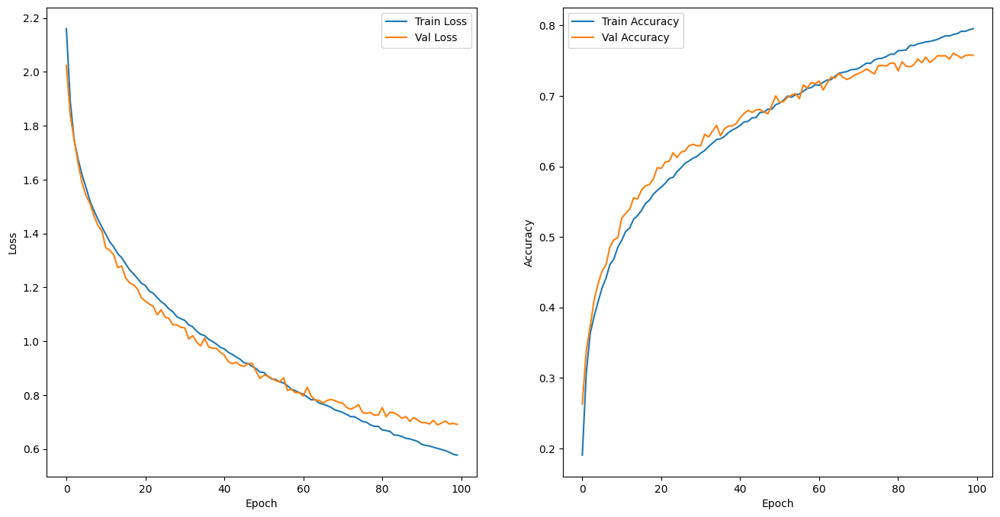

In [ ]:
plot_history(history)

# **※ 실습 ( 개와 고양이 분류 ^^ )**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!wget --no-check-certificate \
https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
-O /tmp/cats_and_dogs_filtered.zip

--2023-07-05 03:04:03--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.24.128, 142.251.10.128, 142.251.12.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.24.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M  19.7MB/s    in 4.0s    

2023-07-05 03:04:07 (16.3 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [ ]:
import os
import zipfile

local_zip = '/tmp/cats_and_dogs_filtered.zip'

zip_ref = zipfile.ZipFile(local_zip, 'r')

zip_ref.extractall('/tmp')
zip_ref.close()

FileNotFoundError: ignored

In [ ]:
# 기본 경로
base_dir = '/tmp/cats_and_dogs_filtered'

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# 훈련에 사용되는 고양이/개 이미지 경로
train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')
print(train_cats_dir)
print(train_dogs_dir)

# 테스트에 사용되는 고양이/개 이미지 경로
validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')
print(validation_cats_dir)
print(validation_dogs_dir)

/tmp/cats_and_dogs_filtered/train/cats
/tmp/cats_and_dogs_filtered/train/dogs
/tmp/cats_and_dogs_filtered/validation/cats
/tmp/cats_and_dogs_filtered/validation/dogs


In [ ]:
train_cat_fnames = os.listdir( train_cats_dir )
train_dog_fnames = os.listdir( train_dogs_dir )

print(train_cat_fnames[:5])
print(train_dog_fnames[:5])

['cat.616.jpg', 'cat.193.jpg', 'cat.488.jpg', 'cat.733.jpg', 'cat.53.jpg']
['dog.707.jpg', 'dog.189.jpg', 'dog.736.jpg', 'dog.421.jpg', 'dog.878.jpg']


In [ ]:
print('Total training cat images :', len(os.listdir(train_cats_dir)))
print('Total training dog images :', len(os.listdir(train_dogs_dir)))

print('Total validation cat images :', len(os.listdir(validation_cats_dir)))
print('Total validation dog images :', len(os.listdir(validation_dogs_dir)))

Total training cat images : 1000
Total training dog images : 1000
Total validation cat images : 500
Total validation dog images : 500


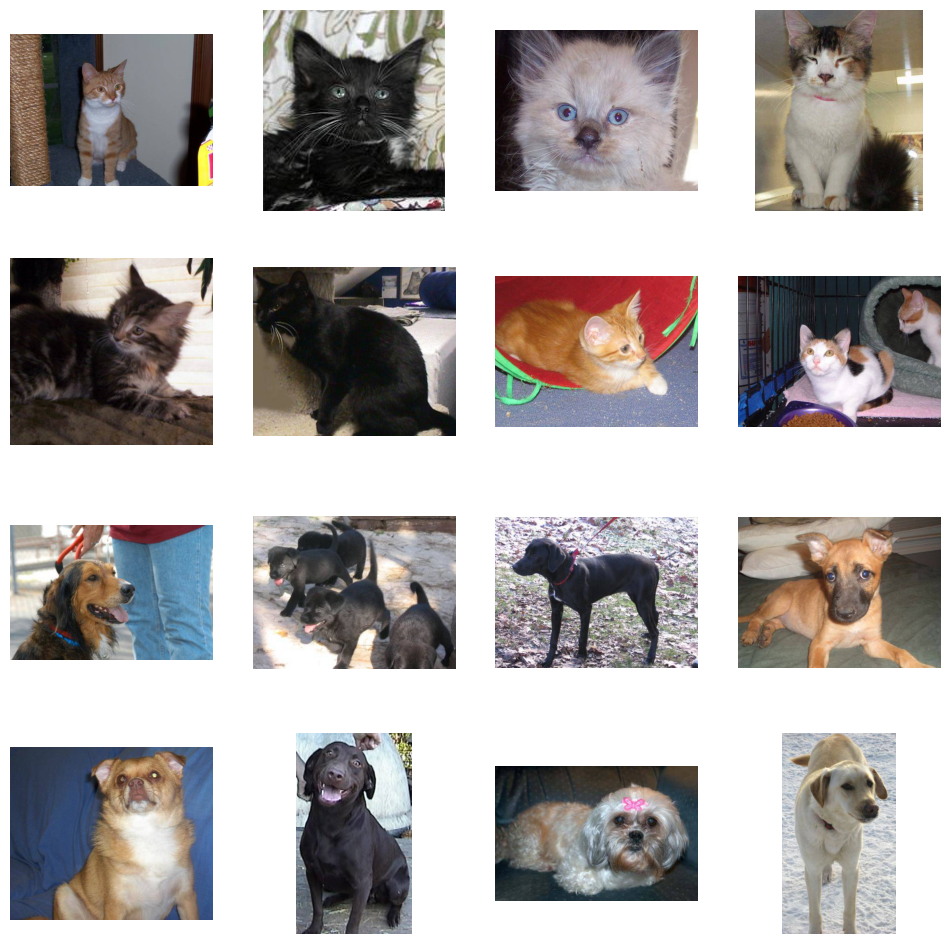

In [ ]:
%matplotlib inline

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

nrows, ncols = 4, 4
pic_index = 0

fig = plt.gcf()
fig.set_size_inches(ncols*3, nrows*3)

pic_index+=8

next_cat_pix = [os.path.join(train_cats_dir, fname)
                for fname in train_cat_fnames[ pic_index-8:pic_index]]

next_dog_pix = [os.path.join(train_dogs_dir, fname)
                for fname in train_dog_fnames[ pic_index-8:pic_index]]

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off')

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [ ]:
import tensorflow as tf


model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150, 150, 3)),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(512, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 74, 74, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_31 (Conv2D)          (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 36, 36, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_32 (Conv2D)          (None, 34, 34, 64)        18496     
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 17, 17, 64)     

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(optimizer=RMSprop(lr=0.001),
            loss='binary_crossentropy',
            metrics = ['accuracy'])

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator( rescale = 1.0/255. )
test_datagen  = ImageDataGenerator( rescale = 1.0/255. )

train_generator = train_datagen.flow_from_directory(train_dir,
                                                  batch_size=20,
                                                  class_mode='binary',
                                                  target_size=(150, 150))
validation_generator =  test_datagen.flow_from_directory(validation_dir,
                                                       batch_size=20,
                                                       class_mode  = 'binary',
                                                       target_size = (150, 150))

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
from keras import callbacks

history = model.fit(train_generator,
                    validation_data=validation_generator,
                    steps_per_epoch=100,
                    epochs=100,
                    validation_steps=50,
                    verbose=2)

Epoch 1/100
100/100 - 12s - loss: 4.6440e-08 - accuracy: 1.0000 - val_loss: 3.7806 - val_accuracy: 0.7270 - 12s/epoch - 116ms/step
Epoch 2/100
100/100 - 9s - loss: 4.6273e-08 - accuracy: 1.0000 - val_loss: 3.7814 - val_accuracy: 0.7270 - 9s/epoch - 92ms/step
Epoch 3/100
100/100 - 9s - loss: 4.6095e-08 - accuracy: 1.0000 - val_loss: 3.7826 - val_accuracy: 0.7270 - 9s/epoch - 95ms/step
Epoch 4/100
100/100 - 9s - loss: 4.5911e-08 - accuracy: 1.0000 - val_loss: 3.7833 - val_accuracy: 0.7270 - 9s/epoch - 95ms/step
Epoch 5/100
100/100 - 9s - loss: 4.5775e-08 - accuracy: 1.0000 - val_loss: 3.7842 - val_accuracy: 0.7270 - 9s/epoch - 94ms/step
Epoch 6/100
100/100 - 9s - loss: 4.5563e-08 - accuracy: 1.0000 - val_loss: 3.7855 - val_accuracy: 0.7270 - 9s/epoch - 88ms/step
Epoch 7/100
100/100 - 9s - loss: 4.5417e-08 - accuracy: 1.0000 - val_loss: 3.7864 - val_accuracy: 0.7270 - 9s/epoch - 93ms/step
Epoch 8/100
100/100 - 10s - loss: 4.5267e-08 - accuracy: 1.0000 - val_loss: 3.7874 - val_accuracy: 0.

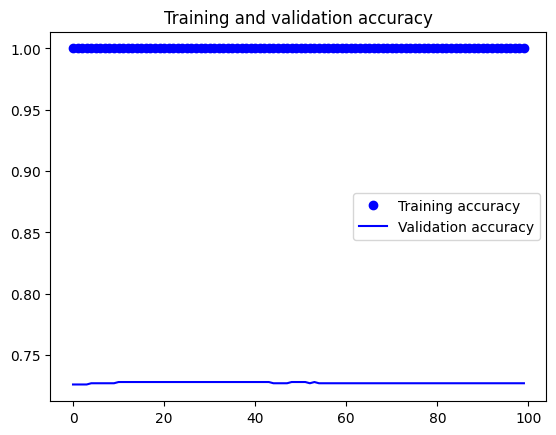

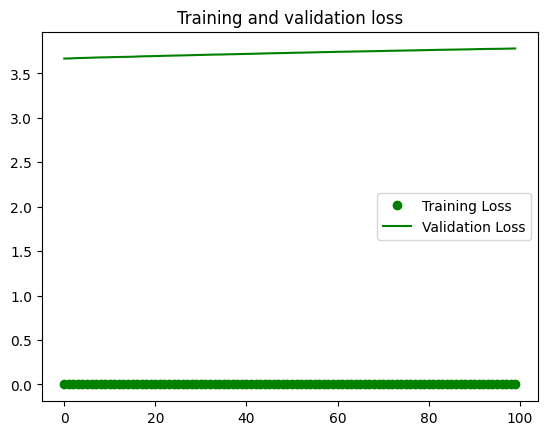

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'go', label='Training Loss')
plt.plot(epochs, val_loss, 'g', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# week2 day2 2023 07 05

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
from PIL import Image , ImageDraw
from sklearn.preprocessing import *
import time
import ast
import os
import keras
import tensorflow as tf
from keras import models, layers
from keras import Input
from keras.models import Model, load_model
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers, initializers, regularizers, metrics
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import BatchNormalization, Conv2D, Activation , AveragePooling2D , Input ,Dropout
from keras.layers import Dense, GlobalAveragePooling2D, MaxPooling2D, ZeroPadding2D, Add, Flatten
from keras.models import Sequential
from keras.metrics import top_k_categorical_accuracy
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras.applications import ResNet50, vgg19,mobilenet_v2,InceptionV3 , InceptionResNetV2,DenseNet169
from tqdm import tqdm
import cv2

In [ ]:
!pip install tensorflow_datasets

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist

In [ ]:
(train_ds, val_ds, test_ds), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


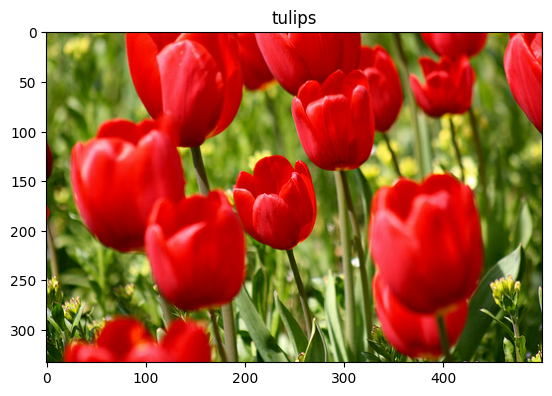

In [ ]:
get_label_name = metadata.features['label'].int2str

image, label = next(iter(train_ds))
_ = plt.imshow(image)
_ = plt.title(get_label_name(label))

In [ ]:
# RandomFlip을 통해 수평 또는 수직으로 주어진 이미지를 flip합니다.
# RandomRotation을 통해 이미지에 회전효과를 줍니다.
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

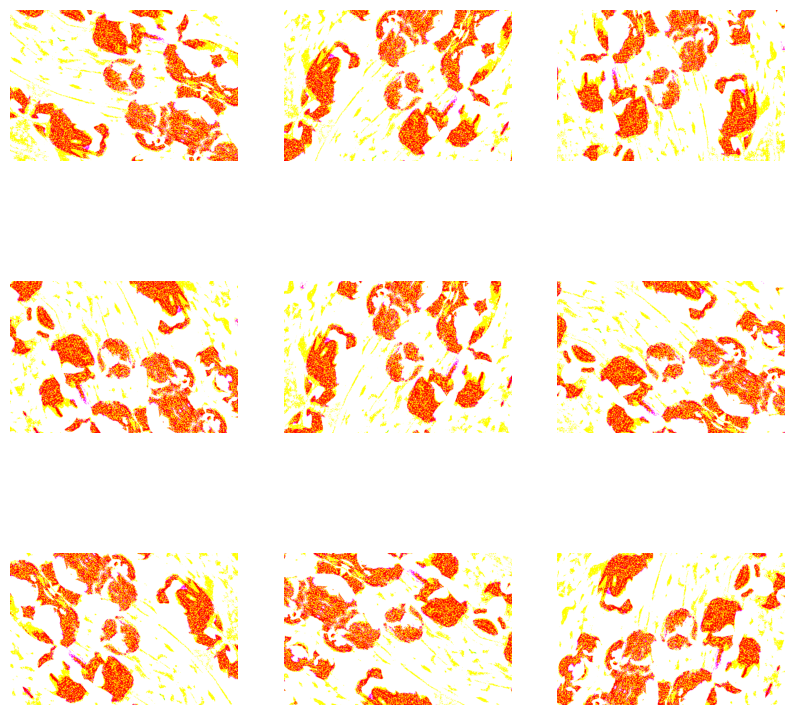

In [ ]:
# 이전 셀에서 증강시킨 이미지 데이터를 출력하여 어떤 변화가 있는지 확인해봅니다.
image = tf.expand_dims(image, 0)

plt.figure(figsize=(10, 10))
for i in range(9):
  augmented_image = data_augmentation(image)
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(augmented_image[0])
  plt.axis("off")

In [ ]:
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#cv2.imread는 이미지를 RGB가 아닌 BGR로 받아오기 때문에 바꿔 주어야함.
image = cv2.cvtColor(cv2.imread('dog.jpg'), cv2.COLOR_BGR2RGB)
plt.imshow(image)

error: ignored

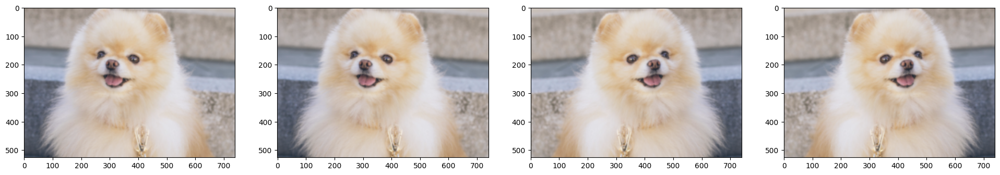

In [ ]:
#augmentation이 적용된 image들을 시각화 해주는 함수
def show_aug_image(image, generator, n_images=4):

    # ImageDataGenerator는 여러개의 image를 입력으로 받기 때문에 4차원으로 입력 해야함.
    image_batch = np.expand_dims(image, axis=0)

    # featurewise_center or featurewise_std_normalization or zca_whitening 가 True일때만 fit 해주어야함
    generator.fit(image_batch)
    # flow로 image batch를 generator에 넣어주어야함.
    data_gen_iter = generator.flow(image_batch)

    fig, axs = plt.subplots(nrows=1, ncols=n_images, figsize=(24, 8))

    for i in range(n_images):
    	#generator에 batch size 만큼 augmentation 적용(매번 적용이 다름)
        aug_image_batch = next(data_gen_iter)
        aug_image = np.squeeze(aug_image_batch)
        aug_image = aug_image.astype('int')
        axs[i].imshow(aug_image)
data_generator = ImageDataGenerator(horizontal_flip=True)
show_aug_image(image, data_generator, n_images=4)

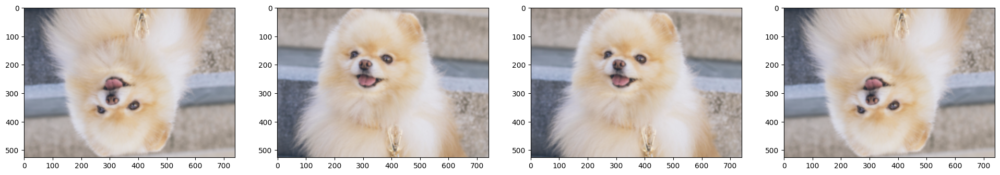

In [ ]:
data_generator = ImageDataGenerator(vertical_flip=True)
show_aug_image(image, data_generator, n_images=4)

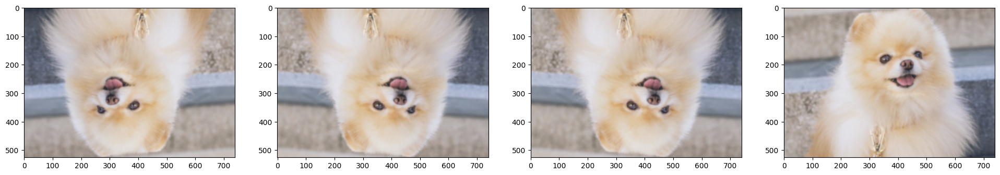

In [ ]:
data_generator = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
show_aug_image(image, data_generator, n_images=4)

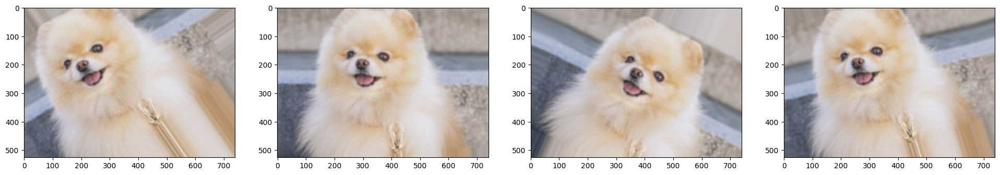

In [ ]:
data_generator = ImageDataGenerator(rotation_range=45)
show_aug_image(image, data_generator, n_images=4)

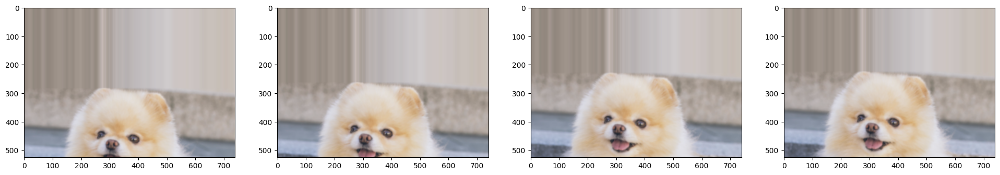

In [ ]:
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='nearest')
show_aug_image(image, data_generator, n_images=4)

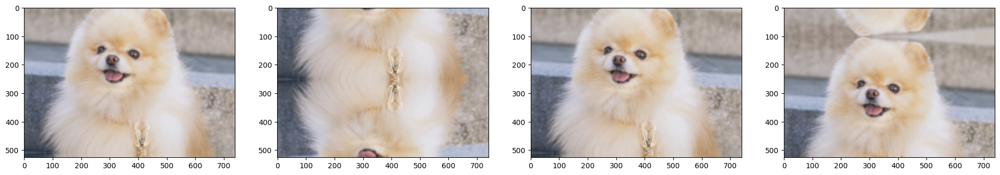

In [ ]:
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='reflect')
show_aug_image(image, data_generator, n_images=4)

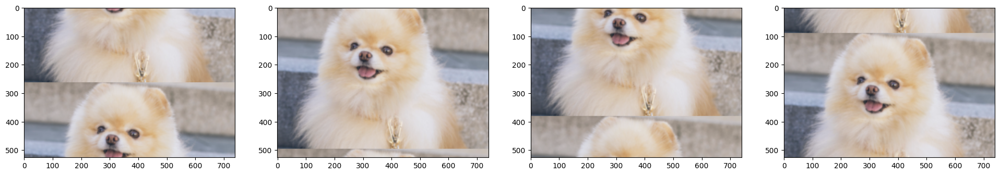

In [ ]:
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='wrap')
show_aug_image(image, data_generator, n_images=4)

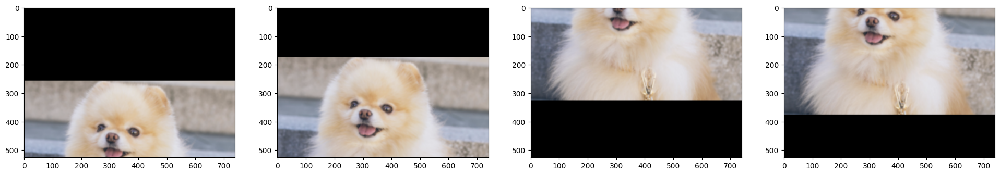

In [ ]:
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='constant', cval=0)
show_aug_image(image, data_generator, n_images=4)

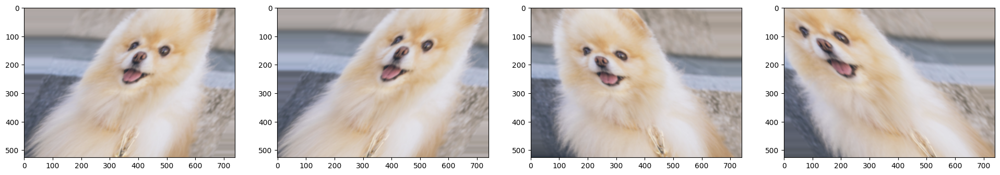

In [ ]:
data_generator = ImageDataGenerator(shear_range=45)
show_aug_image(image, data_generator, n_images=4)

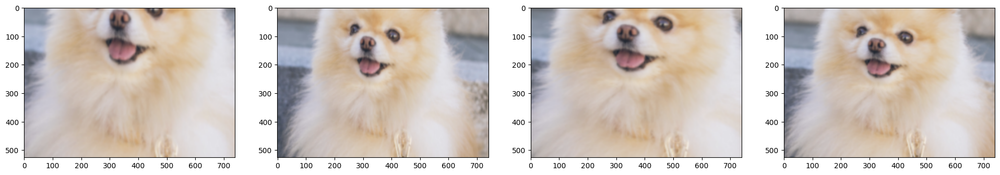

In [ ]:
data_generator = ImageDataGenerator(zoom_range=[0.5, 0.9])
show_aug_image(image, data_generator, n_images=4)

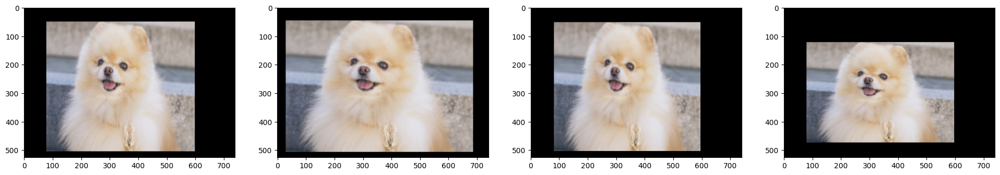

In [ ]:
data_generator = ImageDataGenerator(zoom_range=[1.1, 1.5], fill_mode='constant', cval=0)
show_aug_image(image, data_generator, n_images=4)

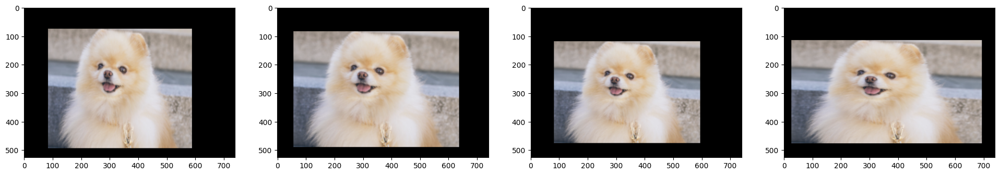

In [ ]:
ata_generator = ImageDataGenerator(brightness_range=(0.1, 0.9))
show_aug_image(image, data_generator, n_images=4)

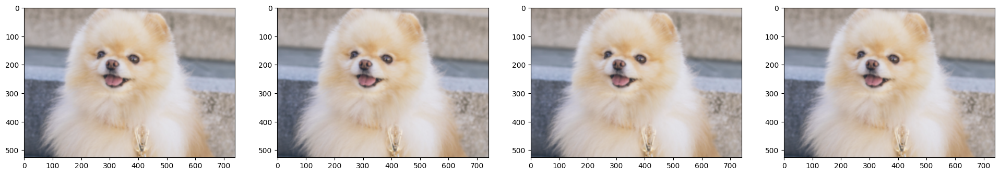

In [ ]:
data_generator = ImageDataGenerator(brightness_range=(1.0, 1.0))
show_aug_image(image, data_generator, n_images=4)

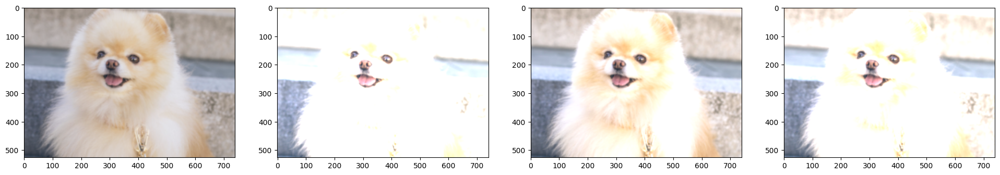

In [ ]:
data_generator = ImageDataGenerator(brightness_range=(1.0, 2.0))
show_aug_image(image, data_generator, n_images=4)

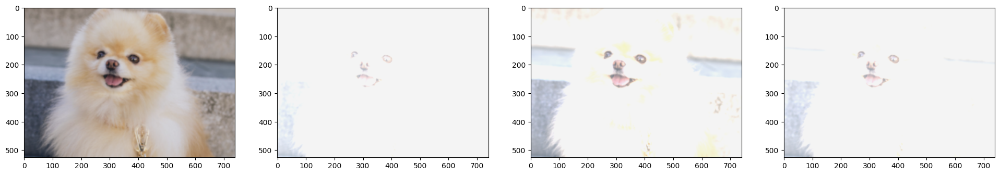

In [ ]:
data_generator = ImageDataGenerator(channel_shift_range=150)
show_aug_image(image, data_generator, n_images=4)

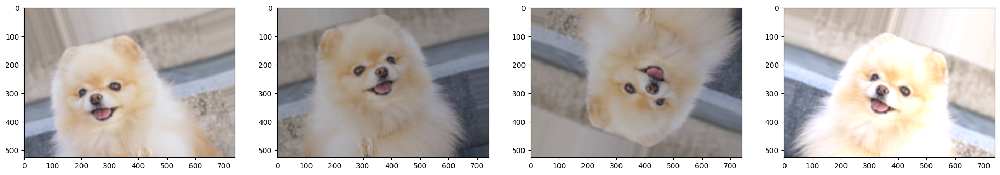

In [ ]:
data_generator = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=(0.7, 1.3),
    horizontal_flip=True,
    vertical_flip=True,
    #rescale=1/255.0 # 학습시 적용, 시각화를 위해 임시로 주석처리
)

show_aug_image(image, data_generator, n_images=4)

**※ Kaggle 설치**

In [ ]:
!pip install kaggle --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for kaggle: filename=kaggle-1.5.15-py3-none-any.whl size=99605 sha256=453e86a1b295a7e27a6455abcc28ec9dbecd515934364d795d1812af2b5e31f4
  Stored in directory: /root/.cache/pip/wheels/46/0f/33/40c049c224ee941c2b3a7abb858fc34d93e827f9a833d40f09
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.13
    Uninstalling kaggle-1.5.13:
      Successfully uninstalled kaggle-1.5.13


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ohjungmin","key":"34bd4c889922da859135d9409c3b1c3a"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!ls -1ha kaggle.json

kaggle.json


# 전의 학습^^

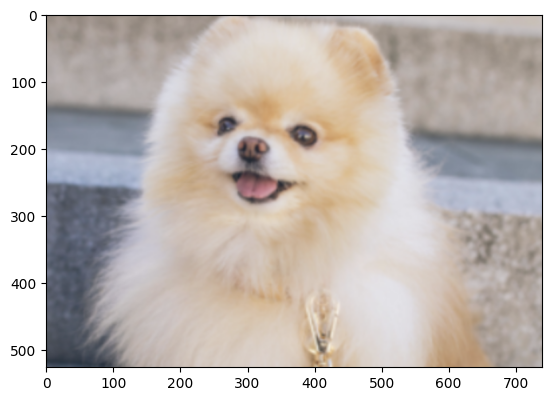

In [ ]:
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#cv2.imread는 이미지를 RGB가 아닌 BGR로 받아오기 때문에 바꿔 주어야함.
image = cv2.cvtColor(cv2.imread('dog.jpg'), cv2.COLOR_BGR2RGB)
plt.imshow(image)

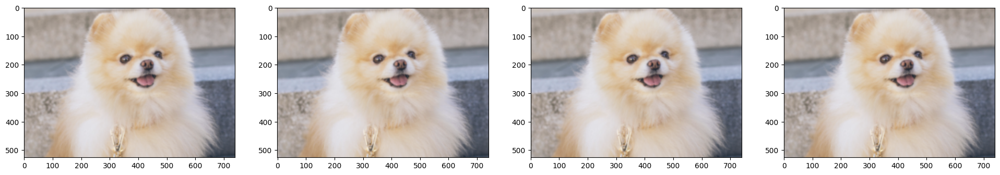

In [ ]:
#augmentation이 적용된 image들을 시각화 해주는 함수
def show_aug_image(image, generator, n_images=4):

    # ImageDataGenerator는 여러개의 image를 입력으로 받기 때문에 4차원으로 입력 해야함.
    image_batch = np.expand_dims(image, axis=0)

    # featurewise_center or featurewise_std_normalization or zca_whitening 가 True일때만 fit 해주어야함
    generator.fit(image_batch)
    # flow로 image batch를 generator에 넣어주어야함.
    data_gen_iter = generator.flow(image_batch)

    fig, axs = plt.subplots(nrows=1, ncols=n_images, figsize=(24, 8))

    for i in range(n_images):
    	#generator에 batch size 만큼 augmentation 적용(매번 적용이 다름)
        aug_image_batch = next(data_gen_iter)
        aug_image = np.squeeze(aug_image_batch)
        aug_image = aug_image.astype('int')
        axs[i].imshow(aug_image)

data_generator = ImageDataGenerator(horizontal_flip=True)
show_aug_image(image, data_generator, n_images=4)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
tfds.disable_progress_bar()

import tensorflow as tf

keras = tf.keras

In [ ]:
!unzip -qq "/dogs-vs-cats.zip"

unzip:  cannot find or open /dogs-vs-cats.zip, /dogs-vs-cats.zip.zip or /dogs-vs-cats.zip.ZIP.


In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/SKT FLY AI

/content/drive/MyDrive/Colab Notebooks/SKT FLY AI


In [ ]:
!unzip -qq "/content/drive/MyDrive/Colab Notebooks/SKT FLY AI/train.zip"

In [ ]:
#training, validtation, test를 8:1:1로 분할합니다.
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info = True,
    as_supervised = True,
)

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


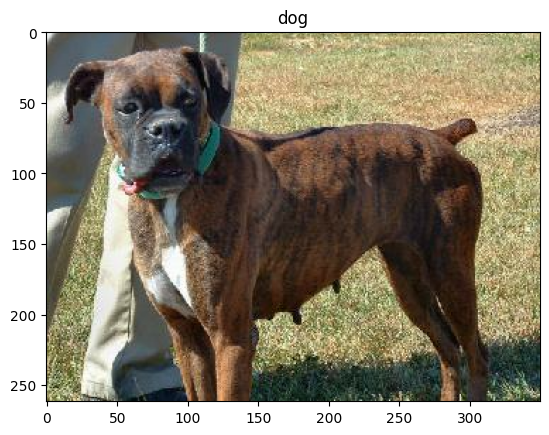

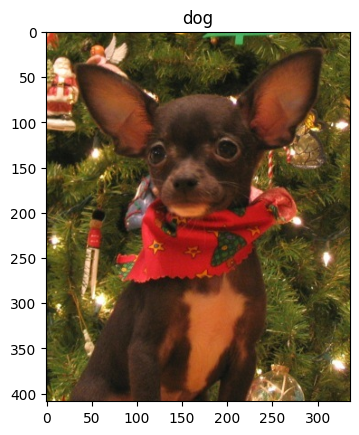

In [ ]:
get_label_name = metadata.features['label'].int2str

for image, label in raw_train.take(2):
    plt.figure()
    plt.imshow(image)
    plt.title(get_label_name(label))

In [ ]:
print(raw_train, raw_validation, raw_test, sep ='\n')

#<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


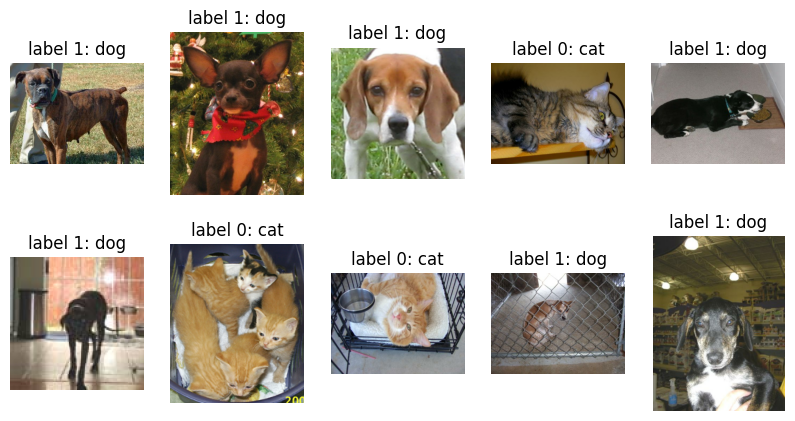

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,5))

get_label_name = metadata.features['label'].int2str
# take() 새로운 데이터 셋 생성
for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [ ]:
img_size = 160

def format_example(image, label):
    image = tf.cast(image, tf.float32) #고양이의 tensorflow 타입
    image = (image/127.5) - 1 # pixel scale -1 ~ 1범위로 수정
    image = tf.image.resize(image, (160, 160))
    return image, label

In [ ]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train, validation, test, sep = '\n')

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


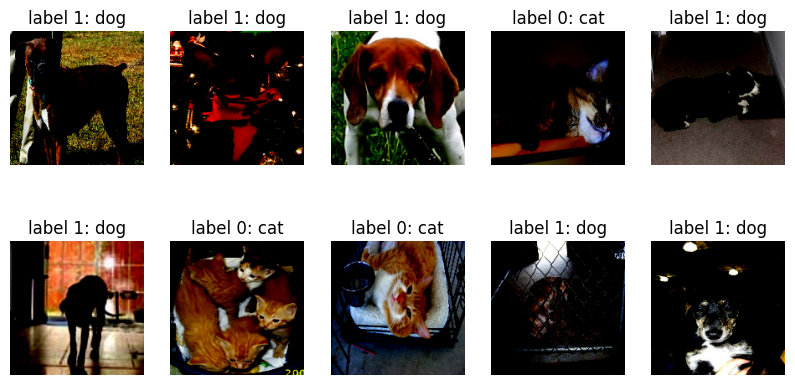

In [ ]:
plt.figure(figsize = (10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    # image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D,Flatten

Model = Sequential([
                    Conv2D(filters = 16,
                           kernel_size = 3,
                           padding = 'same',
                           activation ='relu',
                           input_shape = (160,160,3)),
                    MaxPooling2D(),
                    Conv2D(filters = 32,
                           kernel_size = 3,
                           padding = 'same',
                           activation = 'relu'),
                    MaxPooling2D(),
                    Conv2D(filters = 64,
                           kernel_size = 3,
                           padding = 'same',
                           activation = 'relu'),
                    MaxPooling2D(),
                    Flatten(),
                    Dense(units = 512,
                          activation = 'relu'),
                    Dense(units=2,
                          activation = 'softmax')
])
Model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 20, 20, 64)       0

**※ 특성 평탄화**

In [ ]:
Model.compile(optimizer = tf.keras.optimizers.RMSprop(lr = 0.0001),
              loss = tf.keras.losses.sparse_categorical_crossentropy,
              metrics = ['accuracy'])

In [ ]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [ ]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [ ]:
validation_steps = 20
loss0, accuracy0 = Model.evaluate(validation_batches, steps=validation_steps)
print("initial loss: {:.2f}".format(loss0),"initial accuracy{:.2f}".format(accuracy0),sep="\n")


20/20 [==============================] - 11s 45ms/step - loss: 0.6904 - accuracy: 0.5109
initial loss: 0.69
initial accuracy0.51


In [ ]:
epoch = 10
history = Model.fit(train_batches,
                    epochs = epoch,
                    validation_data = validation_batches)

Epoch 1/10
582/582 [==============================] - 58s 85ms/step - loss: 0.5687 - accuracy: 0.7073 - val_loss: 0.4994 - val_accuracy: 0.7644
Epoch 2/10
582/582 [==============================] - 46s 76ms/step - loss: 0.4322 - accuracy: 0.8019 - val_loss: 0.4544 - val_accuracy: 0.7958
Epoch 3/10
582/582 [==============================] - 45s 75ms/step - loss: 0.3457 - accuracy: 0.8476 - val_loss: 0.4503 - val_accuracy: 0.7949
Epoch 4/10
582/582 [==============================] - 53s 86ms/step - loss: 0.2386 - accuracy: 0.9012 - val_loss: 0.6383 - val_accuracy: 0.7773
Epoch 5/10
582/582 [==============================] - 46s 75ms/step - loss: 0.1258 - accuracy: 0.9525 - val_loss: 0.7240 - val_accuracy: 0.8143
Epoch 6/10
582/582 [==============================] - 46s 76ms/step - loss: 0.0595 - accuracy: 0.9797 - val_loss: 0.8395 - val_accuracy: 0.8169
Epoch 7/10
582/582 [==============================] - 45s 73ms/step - loss: 0.0318 - accuracy: 0.9895 - val_loss: 1.2104 - val_accuracy:

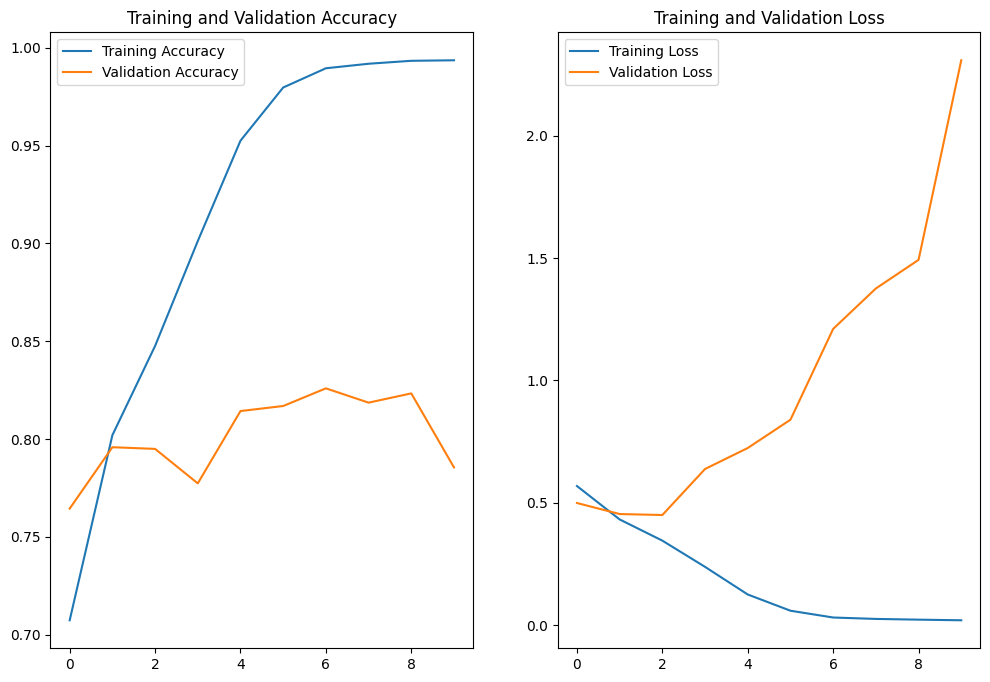

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epoch)

plt.figure(figsize = (12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label = 'Training Accuracy')
plt.plot(epochs_range, val_acc, label = 'Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 0s 294ms/step


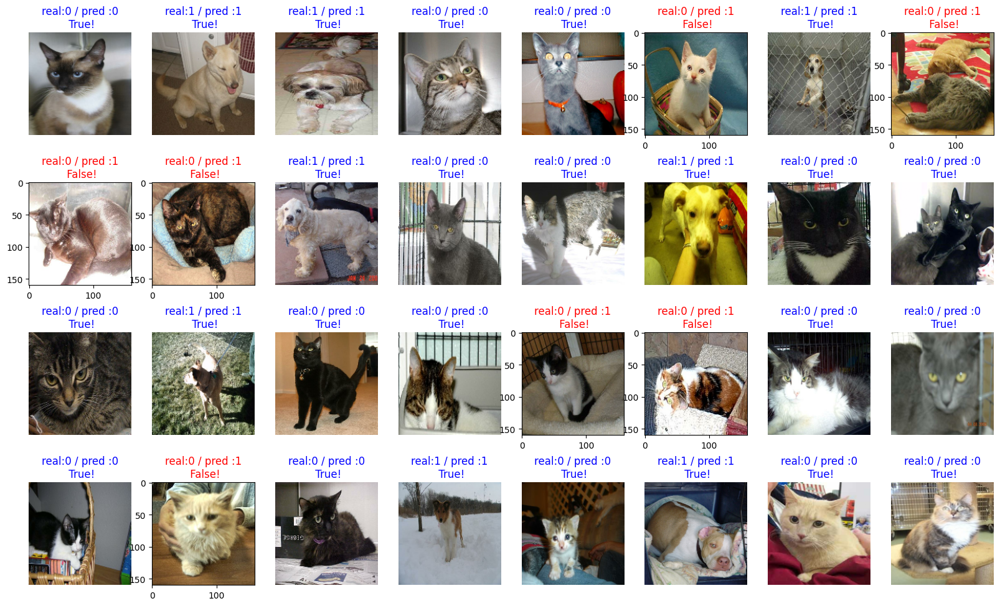

In [ ]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = Model.predict(image_batch)
    pass

predictions = np.argmax(predictions, axis=1)

plt.figure(figsize=(20,12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2 # make image positive
    plt.imshow(image)
    correct = label == prediction
    title = f'real:{label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color':'red'})
    else:
        plt.title(title,fontdict={'color':'blue'})
        plt.axis('off')

**※ 바운딩 박스**